# StyleGAN latent space exploration

## План занятие:
1. Подробнее разобрать StyleGaN
2. Генерация рандомных лиц с помощью StyleGAN 2
3. Исследование разных методовов инверсии  
4. Визуализация точек из латентного пространства и анализ результатов
5. Манипуляции с векторами   


https://github.com/NVlabs/stylegan2-ada-pytorch?tab=readme-ov-file [stylegan2-ada github]

https://github.com/christianversloot/machine-learning-articles/blob/main/stylegan-a-step-by-step-introduction.md [stylegan intro]

https://arxiv.org/pdf/1812.04948.pdf [stylegan]

https://arxiv.org/pdf/1912.04958.pdf [stylegan2]

https://arxiv.org/pdf/2006.06676.pdf [stylegan2-ada]

https://nn.labml.ai/gan/stylegan/index.html [stylegan code explaned]

https://oscar-guarnizo.medium.com/review-image2stylegan-embedding-an-image-into-stylegan-c7989e345271 [latent space]

https://github.com/omertov/encoder4editing?tab=readme-ov-file [encoder for edinig]


## Install dependencies

In [1]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"
# %rm -rf /content/some

In [2]:
!pip install ninja
!pip install imageio-ffmpeg
!pip install -U -q PyDrive
!pip install lpips
!pip install pytorch_msssim
!pip install pytorch-ignite


from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
# Authenticate and create the PyDrive client.
# This only needs to be done once per notebook.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

%mkdir raw_images
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch
%cd stylegan2-ada-pytorch
!git clone https://github.com/denkogit/stylegan2_models


!mkdir pretrained_models
%cd pretrained_models
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl
!wget https://github.com/davisking/dlib-models/raw/master/shape_predictor_68_face_landmarks.dat.bz2
!bzip2 -d /content/stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat.bz2

file_id = '1cUv_reLE6k3604or78EranS7XzuVMWeO' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('e4e_ffhq_encode.pt')

%cd ..
# ref https://github.com/Puzer/stylegan-encoder/blob/master/align_images.py
# !git clone https://github.com/omertov/encoder4editing


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.8/422.8 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 111.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 94.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 106.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-c

Cloning into 'stylegan2-ada-pytorch'...
remote: Enumerating objects: 131, done.
remote: Counting objects: 100% (2/2), done.
remote: Compressing objects: 100% (2/2), done.
remote: Total 131 (delta 0), reused 0 (delta 0), pack-reused 129 (from 2)
Receiving objects: 100% (131/131), 1.13 MiB | 25.17 MiB/s, done.
Resolving deltas: 100% (57/57), done.
/content/stylegan2-ada-pytorch
Cloning into 'stylegan2_models'...
remote: Enumerating objects: 61, done.
remote: Counting objects: 100% (61/61), done.
remote: Compressing objects: 100% (53/53), done.
remote: Total 61 (delta 16), reused 47 (delta 6), pack-reused 0 (from 0)
Receiving objects: 100% (61/61), 26.57 KiB | 8.86 MiB/s, done.
Resolving deltas: 100% (16/16), done.
/content/stylegan2-ada-pytorch/pretrained_models
--2025-05-23 14:44:06--  https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl
Resolving nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)... 3.165.75.59, 3.165.75.119, 3.165.75.24, ...
Connecting to nvlabs

## Download images and vectors

In [3]:
file_id = '1WoiQmg7k-XKYSVNMvAZm_QUqAo_gK5uE' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('/content/celebs.zip')

file_id = '10zYE9lkYq6SuMVL0MaTv4YSuwdg_Wbhg' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('/content/editing.zip')

In [4]:
!unzip /content/celebs.zip -d /content/
!unzip /content/editing.zip -d /content/
! rm -rf /content/__MACOSX

Archive:  /content/celebs.zip
   creating: /content/celebs/
   creating: /content/celebs/AJoly/
  inflating: /content/celebs/AJoly/34c7bef704ac52844e402f6b9b804904.jpg  
  inflating: /content/celebs/AJoly/andzhelina-dzholi-press-konferenciya-neslomlennaya.jpg  
  inflating: /content/celebs/AJoly/67d860b7b0c3be3b216d3d1d059ad424.jpg  
  inflating: /content/celebs/AJoly/f60a8c8e515a1f63c7444842e004447c.jpg  
  inflating: /content/celebs/AJoly/b11ec6657c1d1e413b326e746fd35151.jpg  
   creating: /content/celebs/EMerphy/
  inflating: /content/celebs/EMerphy/kinodrive.com-271-123172.jpg  
  inflating: /content/celebs/EMerphy/18659.jpg  
  inflating: /content/celebs/EMerphy/140.jpg  
  inflating: /content/celebs/EMerphy/2.63451136-1537x2048.jpg  
  inflating: /content/celebs/EMerphy/bolshoj-papochka-57-letnij-eddi-merfi-stanet-otcom-v-desyatyj-raz.jpg  
   creating: /content/celebs/Stethem/
  inflating: /content/celebs/Stethem/stethem6.jpg  
  inflating: /content/celebs/Stethem/1646466328_27-

## Align images

In [5]:
import os
from stylegan2_models.image_aligner.face_alignment import image_align
from stylegan2_models.image_aligner.landmarks_detector import LandmarksDetector


landmarks_model_path = "/content/stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat"
RAW_IMAGES_DIR = "/content/celebs"
ALIGNED_IMAGES_DIR = "/content/aligned_images"

landmarks_detector = LandmarksDetector(landmarks_model_path)
for celeb in os.listdir(RAW_IMAGES_DIR):
  celeb_folder = os.path.join(RAW_IMAGES_DIR, celeb)
  save_path = os.path.join(ALIGNED_IMAGES_DIR, celeb)
  os.makedirs(save_path, exist_ok=True)
  for i, img_name in enumerate(os.listdir(celeb_folder)):
      if img_name == ".ipynb_checkpoints":
        continue
      raw_img_path = os.path.join(celeb_folder, img_name)
      for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
          aligned_face_path = os.path.join(save_path, f"{i}.jpg")
          image_align(raw_img_path, aligned_face_path, face_landmarks)
          break

In [6]:
!zip -r /content/aligned_images.zip /content/aligned_images

  adding: content/aligned_images/ (stored 0%)
  adding: content/aligned_images/LDCaprio/ (stored 0%)
  adding: content/aligned_images/LDCaprio/3.jpg (deflated 0%)
  adding: content/aligned_images/LDCaprio/2.jpg (deflated 0%)
  adding: content/aligned_images/LDCaprio/0.jpg (deflated 0%)
  adding: content/aligned_images/LDCaprio/1.jpg (deflated 0%)
  adding: content/aligned_images/LDCaprio/4.jpg (deflated 0%)
  adding: content/aligned_images/EMerphy/ (stored 0%)
  adding: content/aligned_images/EMerphy/3.jpg (deflated 0%)
  adding: content/aligned_images/EMerphy/2.jpg (deflated 0%)
  adding: content/aligned_images/EMerphy/0.jpg (deflated 0%)
  adding: content/aligned_images/EMerphy/1.jpg (deflated 0%)
  adding: content/aligned_images/EMerphy/4.jpg (deflated 0%)
  adding: content/aligned_images/AJoly/ (stored 0%)
  adding: content/aligned_images/AJoly/3.jpg (deflated 0%)
  adding: content/aligned_images/AJoly/2.jpg (deflated 0%)
  adding: content/aligned_images/AJoly/0.jpg (deflated 0%)
 

# StyleGAN face generation

## StyleGAN face generation

In [7]:
import os
os.chdir("/content/stylegan2-ada-pytorch")
print(os.getcwd())


/content/stylegan2-ada-pytorch


In [8]:
!python3 generate.py --outdir=out --trunc=0.0 --network=pretrained_models/ffhq.pkl --seeds=123

Loading networks from "pretrained_models/ffhq.pkl"...
Generating image for seed 123 (0/1) ...
Setting up PyTorch plugin "bias_act_plugin"... /usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... /usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Done.


In [9]:
import pickle
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# image = ((image * std) + mean)
def plot_image(tensor, plot_size=(10,10)):
  tensor = (tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
  img = Image.fromarray(tensor[0].cpu().numpy(), 'RGB')
  plt.rcParams["figure.figsize"] = plot_size
  plt.imshow(img)


def broadcast_w_sg(w_batch, cast_n=18):
    input_ws = []
    for w in w_batch:
        w_broadcast = torch.broadcast_to(w, (cast_n, 512))
        input_ws.append(w_broadcast)
    return torch.stack(input_ws)


In [10]:
seed = 2345645
noise_mode = 'const' # шум
label = 0 # для разных моделей
device = "cuda:0"
model_path = "/content/stylegan2-ada-pytorch/pretrained_models/ffhq.pkl"

with open(model_path, 'rb') as f:
    G = pickle.load(f)['G_ema'].cuda()

Setting up PyTorch plugin "bias_act_plugin"... 

/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... 

/usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(


Done.


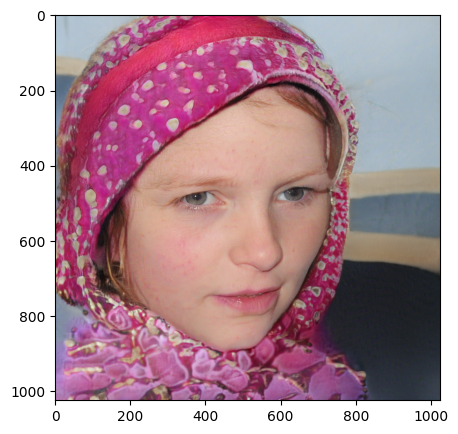

In [11]:
z = torch.from_numpy(np.random.RandomState(seed).randn(1, G.z_dim)).to(device)
ws = G.mapping(z, label)

generated_tensor = G.synthesis(ws, noise_mode=noise_mode, force_fp32=True)
plot_image(generated_tensor, (5,5))


## Truncation


truncation - интерполяция в сторону среднего вектора



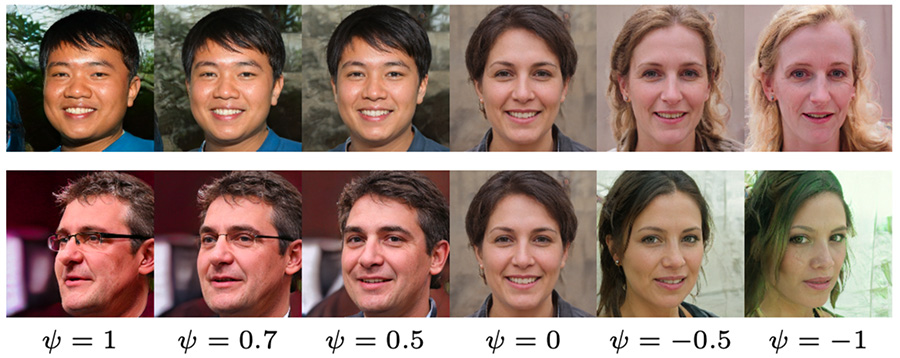

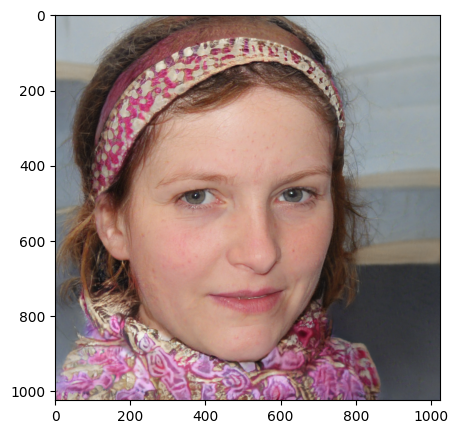

In [12]:
z = torch.from_numpy(np.random.RandomState(seed).randn(1, G.z_dim)).to(device)
ws = G.mapping(z, label, truncation_psi=(0.7))

generated_tensor = G.synthesis(ws, noise_mode=noise_mode, force_fp32=True)
plot_image(generated_tensor, (5,5))

## Projection of real images

In [13]:
!python3 projector.py --outdir=out --num-steps=300 --target=/content/aligned_images/LDCaprio/0.jpg --network=pretrained_models/ffhq.pkl

Loading networks from "pretrained_models/ffhq.pkl"...
Computing W midpoint and stddev using 10000 samples...
Setting up PyTorch plugin "bias_act_plugin"... /usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Done.
Setting up PyTorch plugin "upfirdn2d_plugin"... /usr/local/lib/python3.11/dist-packages/torch/utils/cpp_extension.py:2059: UserWarning: TORCH_CUDA_ARCH_LIST is not set, all archs for visible cards are included for compilation. 
If this is not desired, please set os.environ['TORCH_CUDA_ARCH_LIST'].
  warnings.warn(
Done.
step    1/300: dist 0.64 loss 24567.31
step    2/300: dist 0.67 loss 27640.65
step    3/300: dist 0.71 loss 26120.48
step    4/300: dist 0.57 loss 23382.73
step    5/300: dist 0.52 loss 19894.45
step    6/300: dist 0.64 loss 15979.10
step    7/300:

In [14]:
!rm -r out

Проекция это поиск точки в латентном пространстве которая визуально будет похожа на реальное изображение


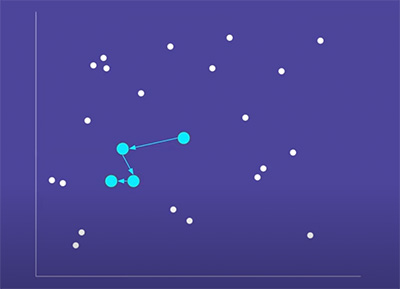

In [15]:
import PIL
import os
import numpy as np
import torch
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from tqdm import tqdm
import torch.nn.functional as F



# https://pypi.org/project/pytorch-msssim/
class Rec_loss(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1_criterion = torch.nn.L1Loss(reduction='mean')

    def forward(self, target, synth):
        target = torch.add(target, 1.0)
        target = torch.mul(target, 127.5)
        target = target / 255

        synth = torch.add(synth, 1.0)
        synth = torch.mul(synth, 127.5)
        synth = synth / 255

        loss = torch.mean(1 - ms_ssim(synth, target, data_range=1, size_average=True))
        return loss


# https://pypi.org/project/lpips/
class Lpips_loss(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.lpips_loss = lpips.LPIPS(net='vgg')
        self.lpips_loss.to(device)
        self.lpips_loss.eval()

    def forward(self, target, synth):
        return torch.mean(self.lpips_loss(target, synth))


# https://github.com/NVlabs/stylegan2-ada-pytorch/blob/main/projector.py#L104
class Reg_loss(nn.Module):
    def __init__(self, noise_bufs):
        super().__init__()
        self.noise_bufs = noise_bufs

    def forward(self,):
        reg_loss = 0.0
        for v in self.noise_bufs.values():
            noise = v[None,None,:,:] # must be [1,1,H,W] for F.avg_pool2d()
            while True:
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=3)).mean()**2
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=2)).mean()**2
                if noise.shape[2] <= 8:
                    break
                noise = F.avg_pool2d(noise, kernel_size=2)
        return reg_loss

# image = (image - mean) / std
def image2tensor_norm(image):
    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    tensor = transform(image)
    return tensor


# загружаем изображение
inv_img_path = "/content/aligned_images/LDCaprio/0.jpg"
target_pil = Image.open(inv_img_path).convert('RGB')
target_tensor = image2tensor_norm(target_pil).to(device).unsqueeze(0)


# инициализируем функции потерь
lpips_loss = Lpips_loss(device)
rec_loss = Rec_loss()

noise_bufs = { name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name }
reg_loss = Reg_loss(noise_bufs)

#  loss weights
regularize_noise_weight = 5e5
rec_weight = 0.5
lpips_weoght = 1

# Параметры для оптимизации
num_steps = 150
seed = 42
initial_learning_rate = 0.05
w_avg_samples = 10000

# Получаем средний вектор латентного пространства
z_samples = torch.from_numpy(np.random.RandomState(seed).randn(w_avg_samples, G.z_dim)).to(device)
w_samples = G.mapping(z_samples, None)
w_samples = w_samples[:, :1, :].cpu().numpy().astype(np.float32)
w_avg = np.mean(w_samples, axis=0, keepdims=True)   # [1, 1, C]
w_std = (np.sum((w_samples - w_avg) ** 2) / w_avg_samples) ** 0.5

# w or w_plus
w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=False) # pylint: disable=not-callable
w_opt = broadcast_w_sg(w_opt).requires_grad_(True)

# w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=True) # pylint: disable=not-callable

optimizer = torch.optim.Adam([w_opt], lr=initial_learning_rate)

generated_tensors = []
for step in tqdm(range(num_steps)):
  synth_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const')

  lpips_value = lpips_loss(synth_tensor, target_tensor)
  rec_value = rec_loss(synth_tensor, target_tensor)
  reg_value = reg_loss()

  loss = lpips_value*lpips_weoght + rec_value*rec_weight + reg_value*regularize_noise_weight

  optimizer.step()
  optimizer.zero_grad(set_to_none=True)
  loss.backward()

  generated_tensors.append(synth_tensor)
generated_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const', force_fp32=True)

# save_image(generated_tensor, path="./projected_image.png")
print(loss.item())

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:04<00:00, 124MB/s] 


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth


100%|██████████| 150/150 [01:35<00:00,  1.57it/s]


114595.4140625


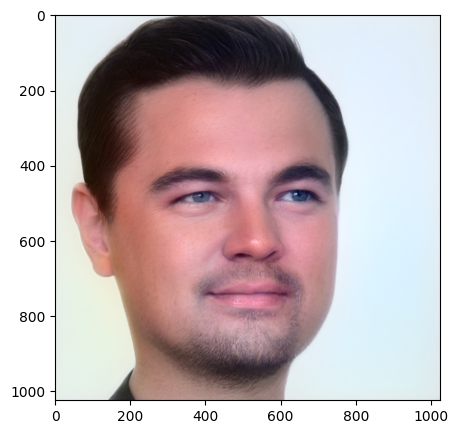

In [16]:
plot_image(generated_tensor, plot_size=(5,5))

In [17]:
import imageio

def save_video(video_path):
  video = imageio.get_writer(video_path, mode='I', fps=10, codec='libx264', bitrate='16M')
  target_uint8 = np.array(target_pil, dtype=np.uint8)
  print (f'Saving optimization progress video {video_path}')
  for synth_image in generated_tensors:
      synth_image = (synth_image + 1) * (255/2)
      synth_image = synth_image.permute(0, 2, 3, 1).clamp(0, 255).to(torch.uint8)[0].cpu().numpy()
      video.append_data(np.concatenate([target_uint8, synth_image], axis=1))
  video.close()

video_path = "/content/proj_video.mp4"
save_video(video_path)

Saving optimization progress video /content/proj_video.mp4


### Encoder for editing

https://arxiv.org/pdf/2102.02766.pdf

Ld-reg - позволяет дельтам не расходиться

Ladv - Дискриминатор сравнивает латенты

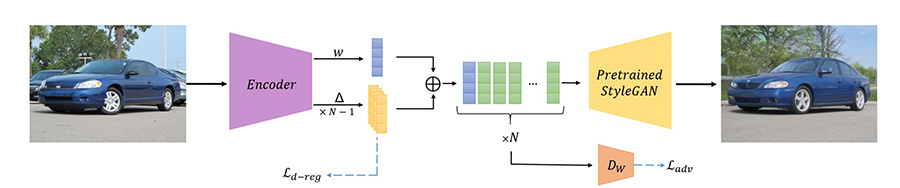

In [18]:
from stylegan2_models.e4e.model_utils import load_e4e_standalone
import torchvision.transforms as transforms

e4e_model, _ = load_e4e_standalone("/content/stylegan2-ada-pytorch/pretrained_models/e4e_ffhq_encode.pt")

image2e4etensor = transforms.Compose([transforms.ToTensor(),
                                transforms.Resize((256, 256)),
                                transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])


In [19]:
image_path = "/content/aligned_images/LDCaprio/0.jpg"
target_pil = Image.open(image_path).convert('RGB')
target_uint8 = np.array(target_pil, dtype=np.uint8)

e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
initial_latent_vector = e4e_model(e4e_tensor)
print(initial_latent_vector.size())

torch.Size([1, 18, 512])


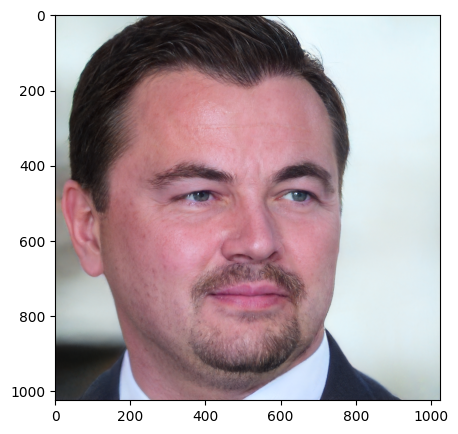

In [20]:
generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)
plot_image(generated_tensor, (5,5))

In [21]:
import torch.nn as nn
from tqdm import tqdm


num_steps = 100
learning_rate = 0.01
initial_latent_vector = nn.Parameter(initial_latent_vector, requires_grad=True)

optimizer = torch.optim.Adam([initial_latent_vector], lr=learning_rate)
generated_tensors = []
for step in tqdm(range(num_steps)):
  synth_tensor = G.synthesis(initial_latent_vector, noise_mode='const')

  lpips_value = lpips_loss(synth_tensor, target_tensor)
  rec_value = rec_loss(synth_tensor, target_tensor)
  reg_value = reg_loss()

  loss = lpips_value*lpips_weoght + rec_value*rec_weight + reg_value*regularize_noise_weight

  optimizer.step()
  optimizer.zero_grad(set_to_none=True)
  loss.backward()
  generated_tensors.append(synth_tensor)
generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)

# save_image(generated_tensor, path="./projected_image.png")
print(loss.item())

100%|██████████| 100/100 [01:02<00:00,  1.59it/s]


114595.3515625


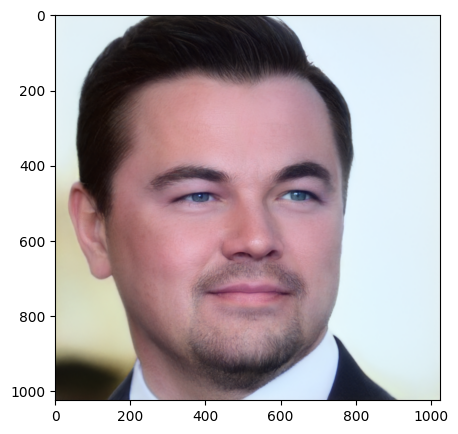

In [22]:
plot_image(generated_tensor, plot_size=(5,5))

In [23]:
video_path = "/content/proj_video_e4e.mp4"
save_video(video_path)

Saving optimization progress video /content/proj_video_e4e.mp4


## Plot latent using PCA

Метод главных компонент

https://habr.com/ru/post/304214/

In [24]:
import os
import glob
import pandas as pd
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox



images_path = "/content/aligned_images"
save_path = "/content/e4e_invertion"

data = []
for persone in sorted(os.listdir(images_path)):
    person_images = os.path.join(images_path, persone)
    save_folder = os.path.join(save_path, persone)
    os.makedirs(save_folder, exist_ok=True)

    for image_name in os.listdir(person_images):
      image_path = os.path.join(person_images, image_name)

      target_pil = Image.open(image_path).convert('RGB')
      target_uint8 = np.array(target_pil, dtype=np.uint8)

      e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)

      latent_vector = e4e_model(e4e_tensor).detach().cpu()
      latent_path = os.path.join(save_folder, f"{image_name[:-4]}.pt")

      torch.save(latent_vector, latent_path)
      data.append([persone, image_name, image_path, latent_path])

df = pd.DataFrame(data, columns = ['key', 'image_name', 'image_path', 'latent_path'])

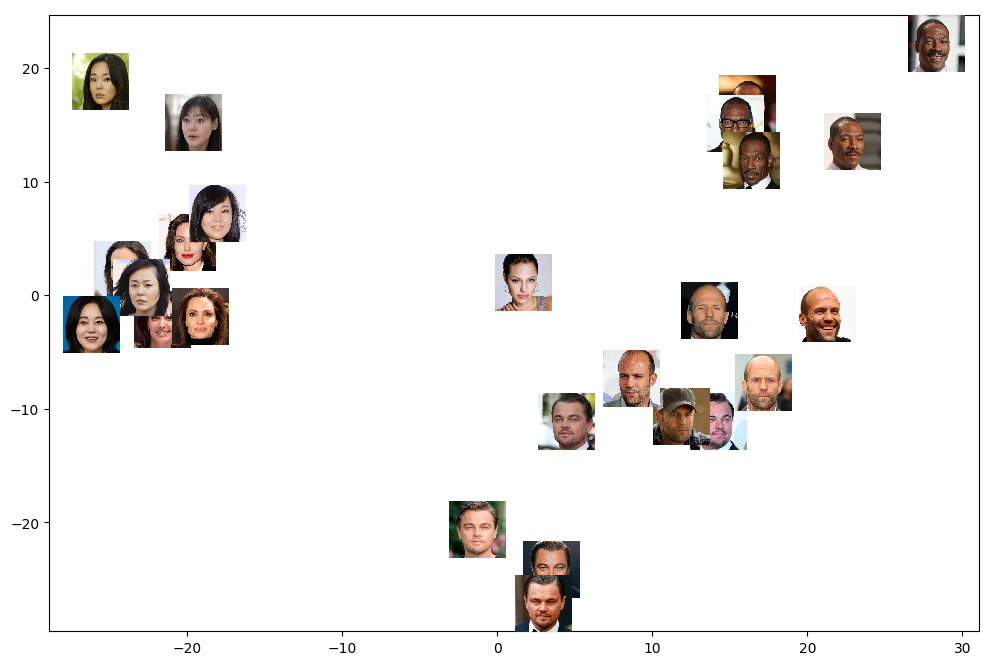

In [25]:

def getImage(path, zoom=0.04):
    return OffsetImage(plt.imread(path), zoom=zoom)

embedings = []
for index, row in df.iterrows():
    latent_path = row["latent_path"]
    latent = torch.load(latent_path).numpy().squeeze(0)
    embedings.append(latent)

batch = np.stack(embedings, axis=0)
batch = batch.reshape((25, 9216))
pca = PCA(n_components=2, random_state=22).fit(batch)
x = pca.transform(batch)

fig, ax = plt.subplots(figsize=(12,8))
# for x, y, path in zip(x[:, 0], x[:, 1], df.image_path.values.tolist()):
for x, y, df_iter in zip(x[:, 0], x[:, 1], df.iterrows()):
  i, row = df_iter
  path = row["image_path"]
  label = row["key"]
  ab = AnnotationBbox(getImage(path), (x, y), frameon=False)
  ax.add_artist(ab)
  plt.scatter(x,y, label=label)

# plt.legend()
plt.show()




## Interpolation and editing

In [26]:
# import locale
# locale.getpreferredencoding = lambda: "UTF-8"
# %rm -rf /content/e4e_invertion

In [27]:
# ! mv /content/stylegan2-ada-pytorch/editing /content


In [28]:
from IPython.display import display, FileLink
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import torch


def interpolate(latent1, latent2, psi=0.5, indeces=[i for i in range(0,18)]):
    init_latent = latent1.clone()
    latent1 = latent1.clone()
    latent2 = latent2.clone()
    for i in indeces:
        latent1[:, i] = latent2[:, i].lerp(latent1[:, i], psi)

    edited_tensor = G.synthesis(latent1, noise_mode='const', force_fp32=True)
    init_tensor = G.synthesis(init_latent, noise_mode='const', force_fp32=True)
    plot_image(torch.cat((init_tensor, edited_tensor ), dim=3), (10,10))




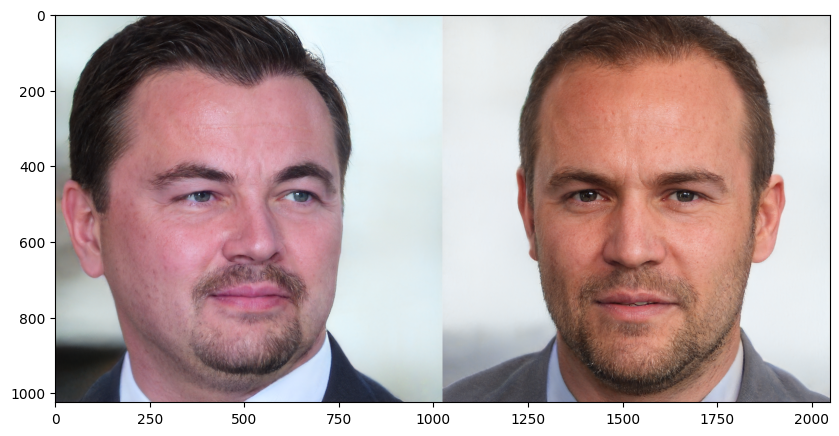

In [29]:
latent1=torch.load("/content/e4e_invertion/LDCaprio/0.pt").to(device)
latent2=torch.load("/content/e4e_invertion/Stethem/4.pt").to(device)

interpolate(latent1, latent2, psi=0.3)

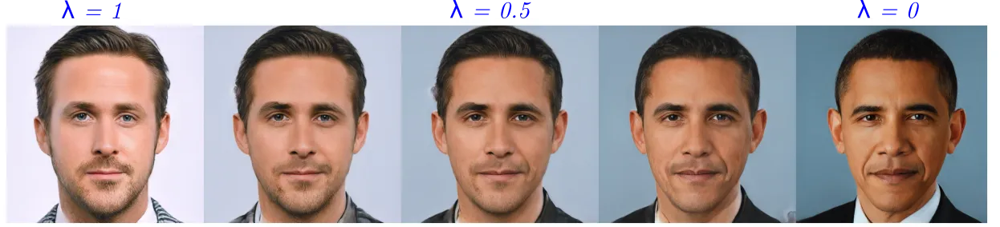

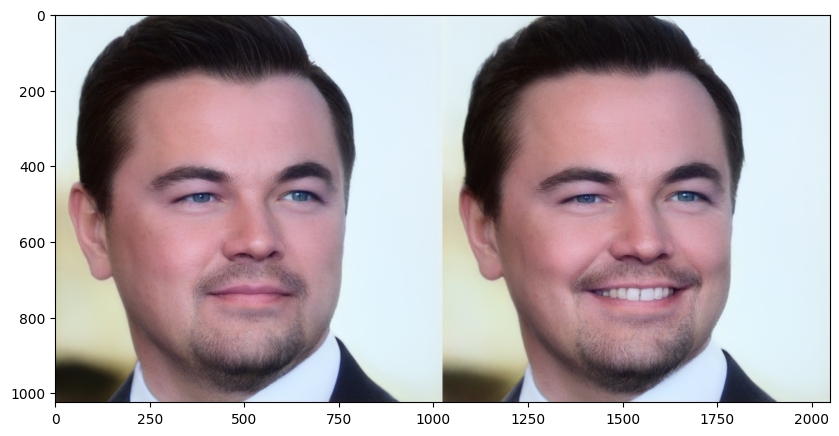

In [30]:

# latent1=torch.load("/content/e4e_invertion/LDCaprio/0.pt").to(device)
latent1 = initial_latent_vector

# latent2=torch.load("/content/editing/age.pt").to(device)
# latent2=torch.load("/content/editing/pose.pt").to(device)
latent2=torch.load("/content/editing/smile.pt").to(device) # 0.5, 1.5 indeces = [0,1,2,3,4,5,6]
latent2 = broadcast_w_sg(latent2)


# interactive(interpolate, latent1=fixed(latent1), latent2=fixed(latent2),
#             psi=widgets.FloatSlider(value=0.5, min=-1.0, max=1.0, step=0.1))

# indeces = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17]
indeces = [4]
interpolate(latent1, latent2, psi=0.3, indeces=indeces)

# Homework

In [31]:
os.chdir('../..')

Используем собственные изображения

In [32]:
from google.colab import drive as gdrive
gdrive.mount('/content/drive')
!cp "/content/drive/My Drive/hw_3_my_celebs.zip" /content/
!unzip /content/hw_3_my_celebs.zip -d /content/

Mounted at /content/drive
Archive:  /content/hw_3_my_celebs.zip
  inflating: /content/hw_3_my_celebs/Linus_Torvalds/linus_torvalds_5.jpg  
  inflating: /content/hw_3_my_celebs/Steve_Jobs/steve_jobs_2.jpg  
  inflating: /content/hw_3_my_celebs/Sam_Altman/sam_altman_5.jpg  
  inflating: /content/hw_3_my_celebs/Bill_Gates/bill_gates_3.jpg  
  inflating: /content/hw_3_my_celebs/Linus_Torvalds/linus_torvalds_1.jpg  
  inflating: /content/hw_3_my_celebs/Sam_Altman/sam_altman_1.jpg  
  inflating: /content/hw_3_my_celebs/Bill_Gates/bill_gates_2.jpg  
  inflating: /content/hw_3_my_celebs/Steve_Jobs/steve_jobs_3.jpg  
  inflating: /content/hw_3_my_celebs/Sam_Altman/sam_altman_2.jpg  
  inflating: /content/hw_3_my_celebs/Linus_Torvalds/linus_torvalds_2.jpg  
  inflating: /content/hw_3_my_celebs/Bill_Gates/bill_gates_1.jpg  
  inflating: /content/hw_3_my_celebs/Sam_Altman/sam_altman_4.jpg  
  inflating: /content/hw_3_my_celebs/Bill_Gates/bill_gates_4.jpg  
  inflating: /content/hw_3_my_celebs/Sam_

Выведем изображения

In [87]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def plot_image_mesh(main_folder_path, horizontal_labels=None):
    subfolders = [f.path for f in os.scandir(main_folder_path) if f.is_dir()]
    if not subfolders:
        print("No subfolders found")
        return

    folders_data = []
    max_images = 0

    for folder_path in subfolders:
        folder_name = os.path.basename(folder_path)
        images = [os.path.join(folder_path, f) for f in sorted(os.listdir(folder_path))
                 if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif'))]

        if images:
            folders_data.append({'name': folder_name, 'images': images})
            max_images = max(max_images, len(images))

    if not folders_data:
        print("No images found")
        return

    num_folders = len(folders_data)
    num_cols = max_images + 1
    fig, axes = plt.subplots(num_folders, num_cols, figsize=(num_cols * 2, num_folders * 2))

    if num_folders == 1:
        axes = axes.reshape(1, -1)

    if horizontal_labels is not None and len(horizontal_labels) >= max_images:
        for col in range(1, max_images + 1):
            axes[0, col].set_title(horizontal_labels[col-1], fontsize=10)

    for row, folder in enumerate(folders_data):
        axes[row, 0].text(0.5, 0.5, folder['name'], ha='center', va='center', fontsize=12)
        axes[row, 0].axis('off')

        for col, img_path in enumerate(folder['images'], start=1):
            try:
                img = Image.open(img_path)
                axes[row, col].imshow(img)
            except:
                axes[row, col].text(0.5, 0.5, "Error", ha='center', va='center')
            axes[row, col].axis('off')

    for row in range(num_folders):
        for col in range(len(folders_data[row]['images']) + 1, num_cols):
            axes[row, col].axis('off')

    plt.tight_layout()
    plt.show()

In [34]:
os.chdir('content')

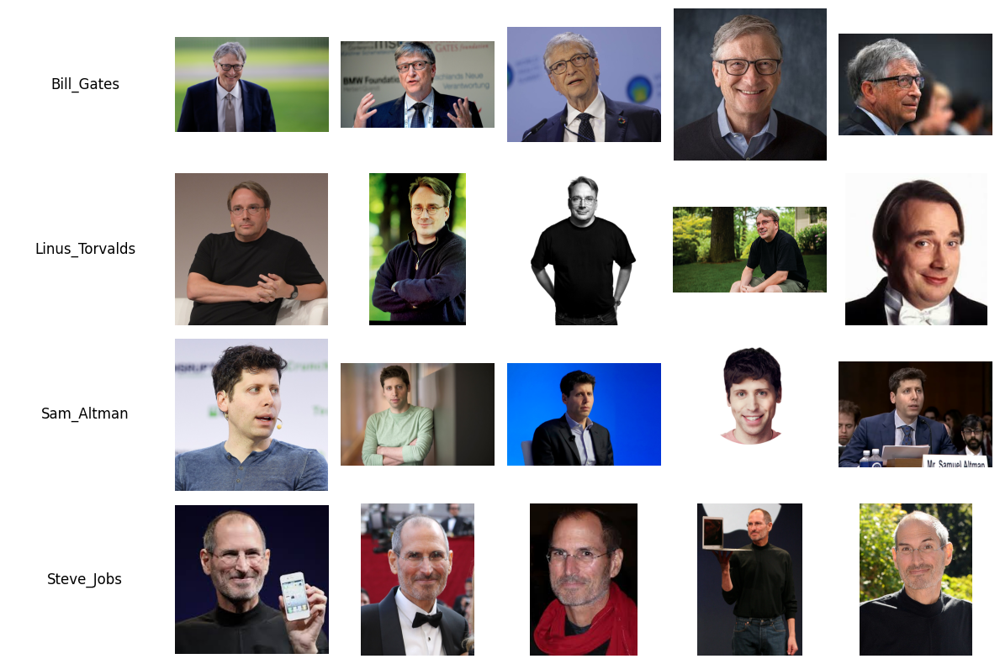

In [88]:
plot_image_mesh('hw_3_my_celebs')

Кадрируем изображения для соответствия данным трейна

In [36]:
landmarks_model_path = "/content/stylegan2-ada-pytorch/pretrained_models/shape_predictor_68_face_landmarks.dat"
RAW_IMAGES_DIR = "/content/hw_3_my_celebs"
ALIGNED_IMAGES_DIR = "/content/hw_3_my_celebs_aligned"

landmarks_detector = LandmarksDetector(landmarks_model_path)

for celeb in os.listdir(RAW_IMAGES_DIR):
  celeb_folder = os.path.join(RAW_IMAGES_DIR, celeb)
  save_path = os.path.join(ALIGNED_IMAGES_DIR, celeb)
  os.makedirs(save_path, exist_ok=True)
  for i, img_name in enumerate(os.listdir(celeb_folder)):
      if img_name == ".ipynb_checkpoints":
        continue
      raw_img_path = os.path.join(celeb_folder, img_name)
      for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
          aligned_face_path = os.path.join(save_path, f"{i}.jpg")
          image_align(raw_img_path, aligned_face_path, face_landmarks)
          break

Посмотрим на результат

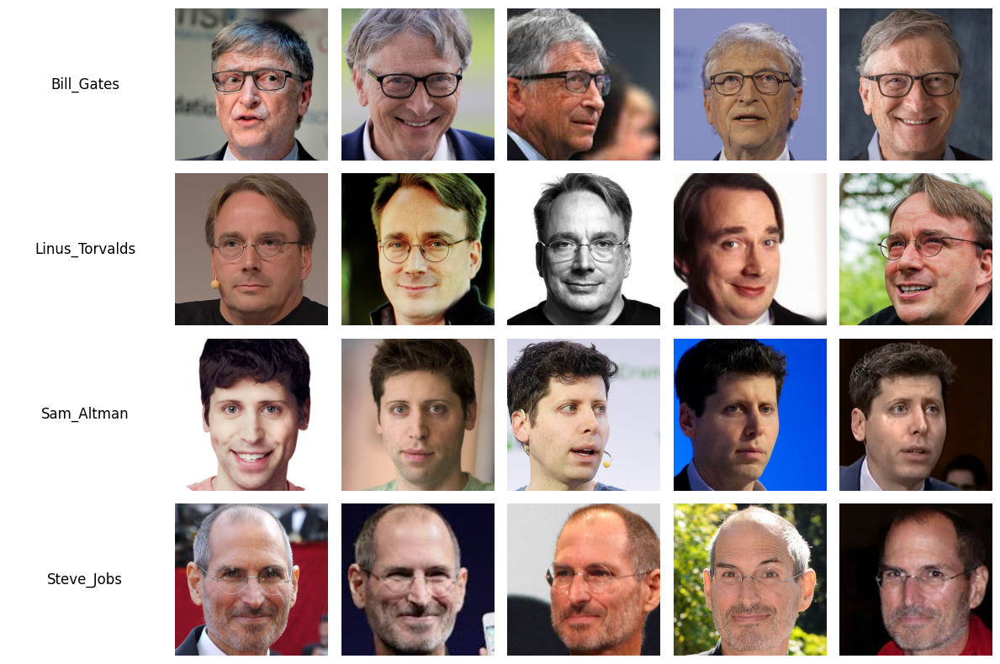

In [37]:
plot_image_mesh('hw_3_my_celebs_aligned')

Найдем вектора каждого человека в пространстве StyleGan

In [38]:
os.chdir("/content/stylegan2-ada-pytorch")

In [39]:
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from tqdm import tqdm
import torch.nn.functional as F
from PIL import Image
import pandas as pd
from stylegan2_models.e4e.model_utils import load_e4e_standalone


def save_image(tensor, path):
    img = (tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img = img[0].cpu().numpy()
    Image.fromarray(img).save(path)

def image2tensor_norm(image):
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
    return transform(image).to(device).unsqueeze(0)

def image2e4etensor(image):
    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((256, 256)),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ])
    return transform(image).to(device).unsqueeze(0)


class Rec_loss(nn.Module):
    def __init__(self):
        super().__init__()
        self.l1_criterion = torch.nn.L1Loss(reduction='mean')

    def forward(self, target, synth):
        target = torch.add(target, 1.0)
        target = torch.mul(target, 127.5)
        target = target / 255

        synth = torch.add(synth, 1.0)
        synth = torch.mul(synth, 127.5)
        synth = synth / 255

        loss = torch.mean(1 - ms_ssim(synth, target, data_range=1, size_average=True))
        return loss


class Lpips_loss(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.lpips_loss = lpips.LPIPS(net='vgg').to(device)
        self.lpips_loss.eval()

    def forward(self, target, synth):
        return torch.mean(self.lpips_loss(target, synth))


class Reg_loss(nn.Module):
    def __init__(self, noise_bufs):
        super().__init__()
        self.noise_bufs = noise_bufs

    def forward(self):
        reg_loss = 0.0
        for v in self.noise_bufs.values():
            noise = v[None,None,:,:]
            while True:
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=3)).mean()**2
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=2)).mean()**2
                if noise.shape[2] <= 8:
                    break
                noise = F.avg_pool2d(noise, kernel_size=2)
        return reg_loss


def optimize_latent_vector(G, target_tensor, device, num_steps=150, seed=42):

    lpips_loss = Lpips_loss(device)
    rec_loss = Rec_loss()
    noise_bufs = {name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name}
    reg_loss = Reg_loss(noise_bufs)

    regularize_noise_weight = 5e5
    rec_weight = 0.5
    lpips_weight = 1

    w_avg_samples = 10000
    z_samples = torch.from_numpy(np.random.RandomState(seed).randn(w_avg_samples, G.z_dim)).to(device)
    w_samples = G.mapping(z_samples, None)
    w_samples = w_samples[:, :1, :].cpu().numpy().astype(np.float32)
    w_avg = np.mean(w_samples, axis=0, keepdims=True)  # [1, 1, C]

    w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=True)
    optimizer = torch.optim.Adam([w_opt], lr=0.05)

    for step in range(num_steps):
        synth_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const')

        lpips_value = lpips_loss(synth_tensor, target_tensor)
        rec_value = rec_loss(synth_tensor, target_tensor)
        reg_value = reg_loss()

        loss = lpips_value*lpips_weight + rec_value*rec_weight + reg_value*regularize_noise_weight

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    return w_opt.detach(), loss.item()


def refine_with_e4e(e4e_model, target_tensor_highres, initial_w, device, num_refinement_steps=50):
    resize_to_256 = transforms.Resize((256, 256), antialias=True)
    e4e_input = resize_to_256(target_tensor_highres)

    with torch.no_grad():
        initial_encoding = e4e_model(e4e_input)

    w_opt = initial_w.clone().requires_grad_(True)
    optimizer = torch.optim.Adam([w_opt], lr=0.01)

    for step in range(num_refinement_steps):
        blended_w = 0.5 * w_opt + 0.5 * initial_encoding
        synth_tensor = G.synthesis(broadcast_w_sg(blended_w), noise_mode='const')
        loss = F.mse_loss(synth_tensor, target_tensor_highres)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    return blended_w.detach(), loss.item()

def process_person_folder(person_folder, output_dir, G, e4e_model, device):
    image_files = [f for f in os.listdir(person_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    results = []

    person_name = os.path.basename(person_folder)
    person_output_dir = os.path.join(output_dir, person_name)
    os.makedirs(person_output_dir, exist_ok=True)

    for img_file in image_files:
        img_path = os.path.join(person_folder, img_file)

        target_pil = Image.open(img_path).convert('RGB').resize((1024, 1024))
        target_tensor = image2tensor_norm(target_pil).to(device)

        w_opt, proj_loss = optimize_latent_vector(G, target_tensor, device)
        w_final, refine_loss = refine_with_e4e(e4e_model, target_tensor, w_opt, device)

        base_name = os.path.splitext(img_file)[0]
        pt_path = os.path.join(person_output_dir, f"{base_name}.pt")
        img_path = os.path.join(person_output_dir, f"{base_name}_generated.jpg")

        torch.save(w_final.cpu(), pt_path)

        with torch.no_grad():
            gen_img = G.synthesis(broadcast_w_sg(w_final.to(device)), noise_mode='const')
        save_image(gen_img, img_path)

        results.append({
            'person': person_name,
            'image': img_file,
            'projection_loss': proj_loss,
            'refinement_loss': refine_loss,
            'latent_path': pt_path,
            'generated_path': img_path
        })

    return results

In [40]:
os.chdir("/content")

In [41]:
# e4e_model, _ = load_e4e_standalone("/content/stylegan2-ada-pytorch/pretrained_models/e4e_ffhq_encode.pt")
# e4e_model = e4e_model.to(device)
e4e_model.eval()

input_root = "hw_3_my_celebs_aligned"
output_root = "hw_3_optimized_latents"
os.makedirs(output_root, exist_ok=True)

all_results = []
person_folders = [f for f in os.listdir(input_root) if os.path.isdir(os.path.join(input_root, f))]

for person_folder in person_folders:
    print(f'Person: {person_folder}')
    full_path = os.path.join(input_root, person_folder)
    results = process_person_folder(full_path, output_root, G, e4e_model, device)
    all_results.extend(results)

df = pd.DataFrame(all_results)
csv_path = os.path.join(output_root, "latent_optimization_results.csv")
df.to_csv(csv_path, index=False)

Person: Bill_Gates
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Person: Linus_Torvalds
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Person: Sam_Altman
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Person: Steve_Jobs
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth


In [42]:
df

,person,image,projection_loss,refinement_loss,latent_path,generated_path
0,Bill_Gates,3.jpg,114595.312500,0.017413,hw_3_optimized_latents/Bill_Gates/3.pt,hw_3_optimized_latents/Bill_Gates/3_generated.jpg
1,Bill_Gates,2.jpg,114595.484375,0.062006,hw_3_optimized_latents/Bill_Gates/2.pt,hw_3_optimized_latents/Bill_Gates/2_generated.jpg
2,Bill_Gates,0.jpg,114595.445312,0.035477,hw_3_optimized_latents/Bill_Gates/0.pt,hw_3_optimized_latents/Bill_Gates/0_generated.jpg
3,Bill_Gates,1.jpg,114595.460938,0.042337,hw_3_optimized_latents/Bill_Gates/1.pt,hw_3_optimized_latents/Bill_Gates/1_generated.jpg
4,Bill_Gates,4.jpg,114595.382812,0.016610,hw_3_optimized_latents/Bill_Gates/4.pt,hw_3_optimized_latents/Bill_Gates/4_generated.jpg
5,Linus_Torvalds,3.jpg,114595.265625,0.100690,hw_3_optimized_latents/Linus_Torvalds/3.pt,hw_3_optimized_latents/Linus_Torvalds/3_genera...
6,Linus_Torvalds,2.jpg,114595.304688,0.048741,hw_3_optimized_latents/Linus_Torvalds/2.pt,hw_3_optimized_latents/Linus_Torvalds/2_genera...
7,Linus_Torvalds,0.jpg,114595.343750,0.013651,hw_3_optimized_latents/Linus_Torvalds/0.pt,hw_3_optimized_latents/Linus_Torvalds/0_genera...
8,Linus_Torvalds,1.jpg,114595.539062,0.053863,hw_3_optimized_latents/Linus_Torvalds/1.pt,hw_3_optimized_latents/Linus_Torvalds/1_genera...
9,Linus_Torvalds,4.jpg,114595.531250,0.087351,hw_3_optimized_latents/Linus_Torvalds/4.pt,hw_3_optimized_latents/Linus_Torvalds/4_genera...


Примеры сгенерированных изображений

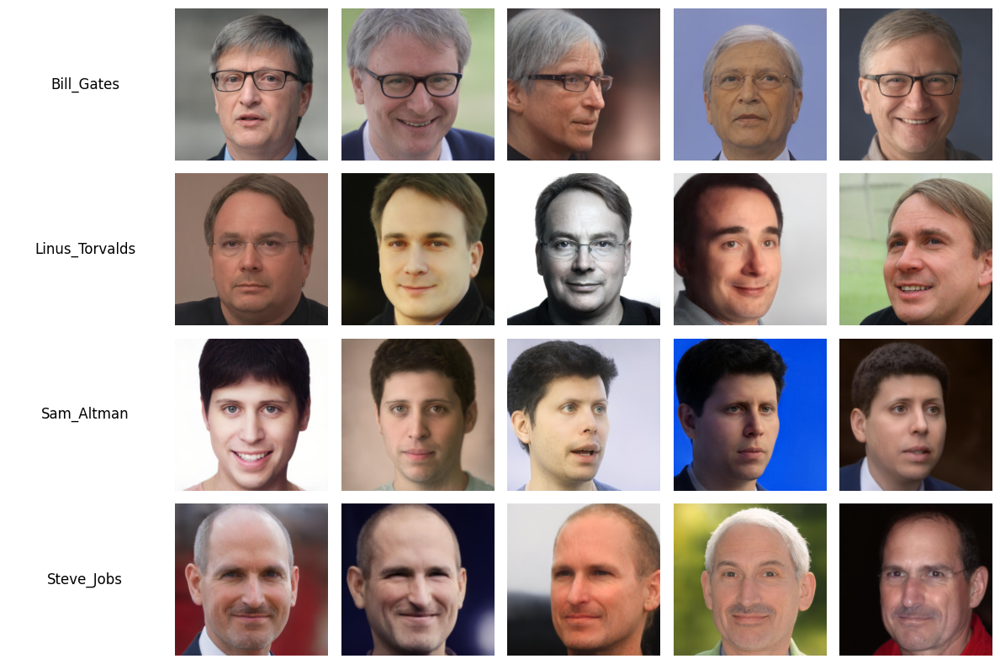

In [43]:
plot_image_mesh('hw_3_optimized_latents')

Изображения получились с применением комбинации градиентной оптимизации и предобученного e4e энкодера (0.5 * вектор_после_оптимизации + 0.5 * вектор_после_e4e). Использовались те же лоссы, как в лекции

#### Style Transfer

Используем стили из папки styles. Закодируем их и применим ко всем изображениям

In [45]:
!cp "/content/drive/My Drive/styles.zip" /content/
!unzip /content/styles.zip -d /content/

Archive:  /content/styles.zip
   creating: /content/styles/
   creating: /content/styles/anime/
  inflating: /content/styles/anime/anime.jpg  
   creating: /content/styles/avatar/
  inflating: /content/styles/avatar/avatar.jpg  
   creating: /content/styles/minecraft/
  inflating: /content/styles/minecraft/steve_style.jpg  


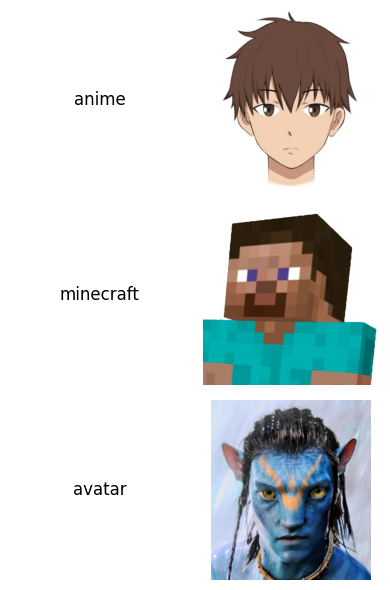

In [46]:
plot_image_mesh('styles')

In [47]:
def apply_style(G, style_path, images_path, styled_images_path, device='cuda', alpha=0.5):
  print(f'Applying style: {style_path}')

  os.makedirs(styled_images_path, exist_ok=True)

  style_files = [f for f in os.listdir(style_path) if not f.startswith('.')]
  style_img_file = os.path.join(style_path, style_files[0])
  style_img = Image.open(style_img_file).convert('RGB').resize((1024, 1024))
  style_tensor = image2tensor_norm(style_img).to(device)

  w_style, _ = optimize_latent_vector(G, style_tensor, device, num_steps=200)

  for person_folder in os.listdir(images_path):
      person_path = os.path.join(images_path, person_folder)
      if not os.path.isdir(person_path):
          continue

      output_person_path = os.path.join(styled_images_path, person_folder)
      os.makedirs(output_person_path, exist_ok=True)

      for pt_file in os.listdir(person_path):
          if not pt_file.endswith('.pt'):
              continue

          w_image = torch.load(os.path.join(person_path, pt_file)).to(device)
          w_styled = (1 - alpha) * w_image + alpha * w_style

          with torch.no_grad():
              styled_img = G.synthesis(broadcast_w_sg(w_styled), noise_mode='const')
              output_filename = pt_file.replace('.pt', '.jpg')
              save_image(styled_img, os.path.join(output_person_path, output_filename))

In [48]:
for style in ['anime', 'minecraft', 'avatar']:
  apply_style(G, f'styles/{style}', 'hw_3_optimized_latents', f'hw_3_styled_{style}', device, 0.5)

Applying style: styles/anime
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Applying style: styles/minecraft
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
Applying style: styles/avatar
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth


Слева - при применении стиля на 50%, слева - на 100

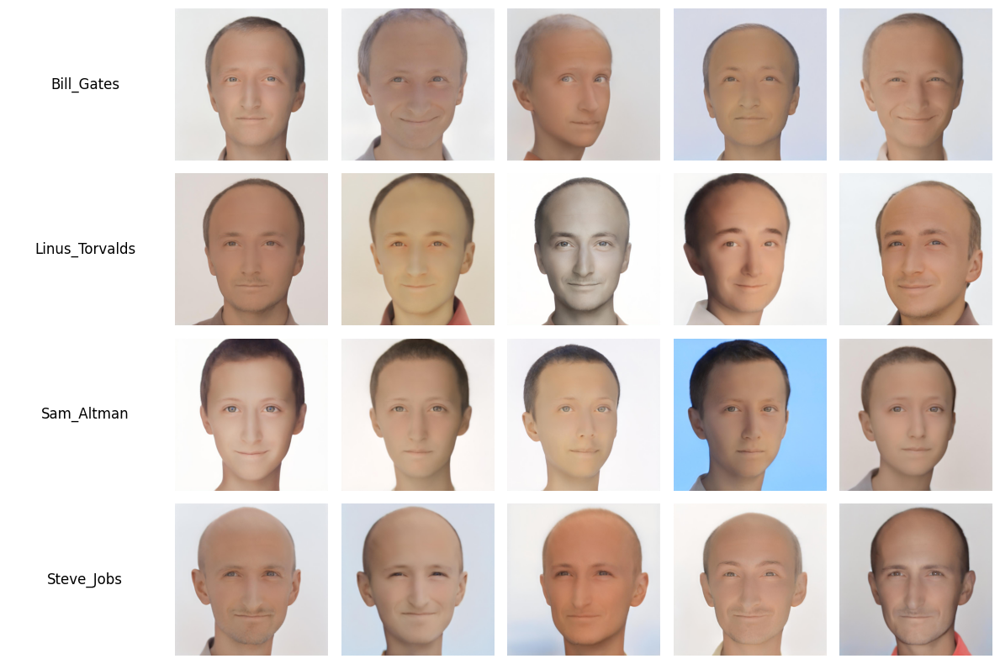

In [49]:
plot_image_mesh('hw_3_styled_anime')

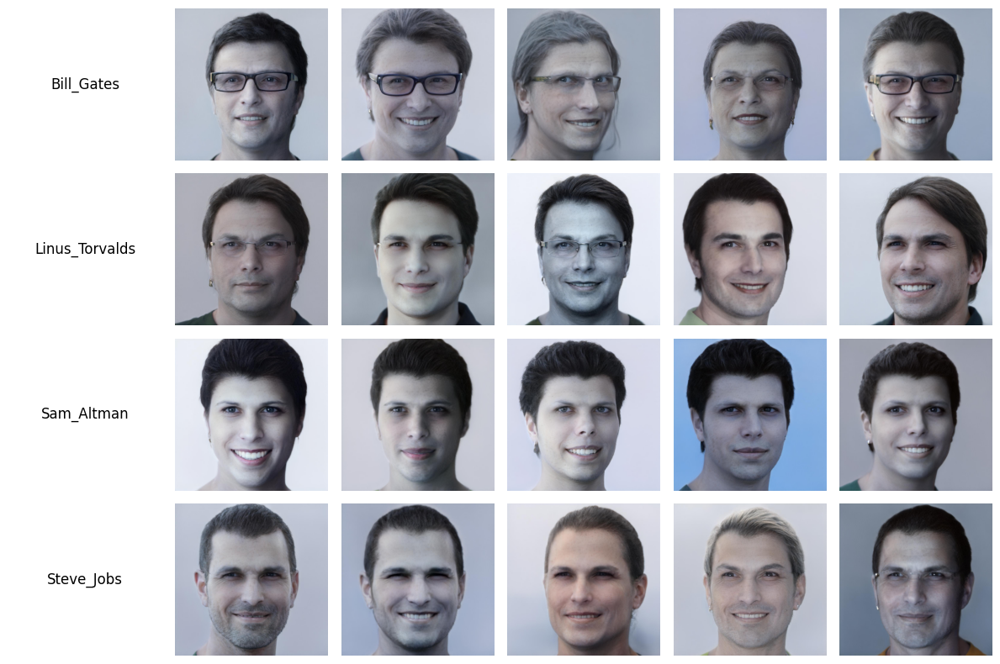

In [50]:
plot_image_mesh('hw_3_styled_avatar')

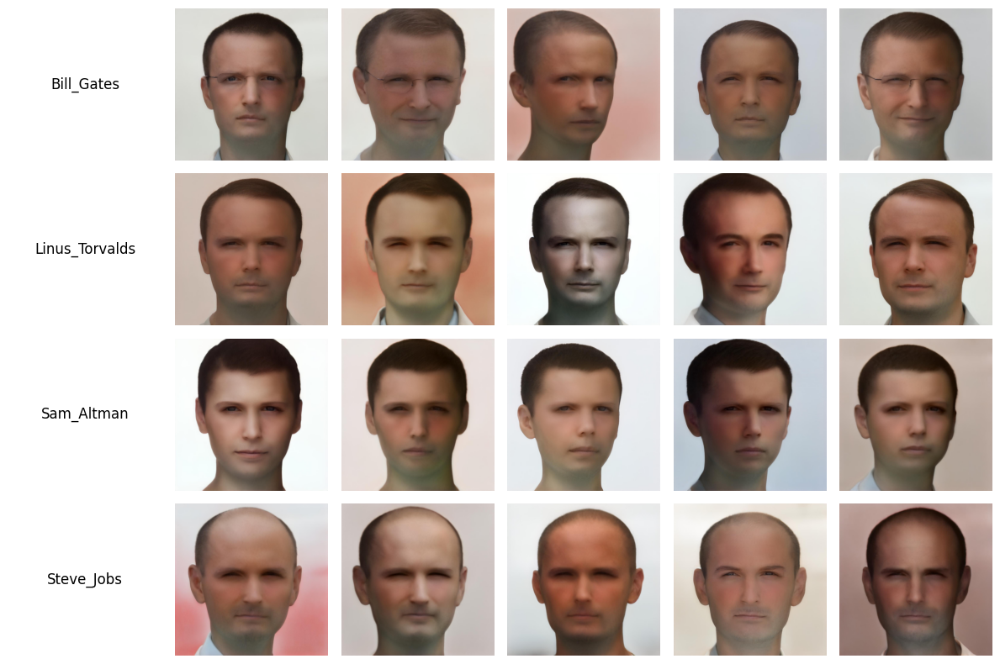

In [51]:
plot_image_mesh('hw_3_styled_minecraft')

### Face Swap

In [52]:
file_id = '1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5' # URL id.
downloaded = drive.CreateFile({'id': file_id})
downloaded.GetContentFile('ms1mv3_arcface_r50_fp16.pth')

### Emotion Transfer

In [55]:
import PIL
import os
import numpy as np
import torch
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from stylegan2_models.arcface_model import get_model
import torch.nn.functional as F
from stylegan2_models.e4e.model_utils import load_e4e_standalone
import torchvision.transforms as transforms


def image2tensor_norm(image):
    transform = transforms.Compose([transforms.ToTensor(),
                                   transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    tensor = transform(image)
    return tensor


class Arcface_Loss(nn.Module):
    def __init__(self, weights_path, device):
        super().__init__()

        self.arcnet = get_model("r50", fp16=False)
        self.arcnet.load_state_dict(torch.load(weights_path))
        self.arcnet.eval()
        self.arcnet.to(device)

        self.cosin_loss = nn.CosineSimilarity(dim=1, eps=1e-6)

    def forward(self, source, synth):

        source = F.interpolate(source,size=(112,112), mode='bicubic')
        synth = F.interpolate(synth,size=(112,112), mode='bicubic')

        emb1 = self.arcnet(source)
        emb2 = self.arcnet(synth)
        loss = (1 - self.cosin_loss(emb1, emb2))[0]
        return loss

In [56]:
arcface_path = "/content/ms1mv3_arcface_r50_fp16.pth"

In [75]:
def optimize_latent_vector_arcface(G, arcface_path, target_tensor, source_tensor, device, num_steps=150, seed=42):

    lpips_loss = Lpips_loss(device)
    arcface_loss = Arcface_Loss(arcface_path, device)
    noise_bufs = {name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name}
    reg_loss = Reg_loss(noise_bufs)

    regularize_noise_weight = 5e5
    arcface_weight = 1.0
    lpips_weight = 0.8

    w_avg_samples = 10000
    z_samples = torch.from_numpy(np.random.RandomState(seed).randn(w_avg_samples, G.z_dim)).to(device)
    w_samples = G.mapping(z_samples, None)
    w_samples = w_samples[:, :1, :].cpu().numpy().astype(np.float32)
    w_avg = np.mean(w_samples, axis=0, keepdims=True)  # [1, 1, C]

    w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=True)
    optimizer = torch.optim.Adam([w_opt], lr=0.05)

    for step in range(num_steps):
        synth_tensor = G.synthesis(broadcast_w_sg(w_opt), noise_mode='const')
        lpips_value = lpips_loss(synth_tensor, target_tensor)
        arcface_value = arcface_loss(source_tensor, synth_tensor)
        reg_value = reg_loss()

        loss = (lpips_value * lpips_weight +
                arcface_value * arcface_weight +
                reg_value * regularize_noise_weight)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    return w_opt.detach(), loss.item()

In [84]:
def make_face_swap(model, arcface_path, original_path, result_path):
  for source_dir in os.listdir(original_path):
    for target_dir in os.listdir(original_path):
      original_image_path = os.listdir(os.path.join(original_path, source_dir))[0]
      target_image_path = os.listdir(os.path.join(original_path, target_dir))[0]
      original_image = Image.open(os.path.join(original_path, source_dir, original_image_path))
      target_image = Image.open(os.path.join(original_path, target_dir, target_image_path))

      source_tensor = image2tensor_norm(original_image).unsqueeze(0).to(device)
      target_tensor = image2tensor_norm(target_image).unsqueeze(0).to(device)
      w_opt, loss = optimize_latent_vector_arcface(G, arcface_path, target_tensor, source_tensor, device)
      print(w_opt.shape)

      with torch.no_grad():
        swapped_face = model.synthesis(broadcast_w_sg(w_opt), noise_mode='const')

      save_dir = os.path.join(result_path, source_dir)
      os.makedirs(save_dir, exist_ok=True)

      img_save_path = os.path.join(save_dir, f'{target_dir}.png')
      save_image(swapped_face, img_save_path)

In [85]:
import warnings
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  make_face_swap(G, arcface_path, 'hw_3_my_celebs_aligned', 'hw_3_face_swap')

Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
torch.Size([1, 1, 512])
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
torch.Size([1, 1, 512])
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
torch.Size([1, 1, 512])
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
torch.Size([1, 1, 512])
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth
torch.Size([1, 1, 512])
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from:

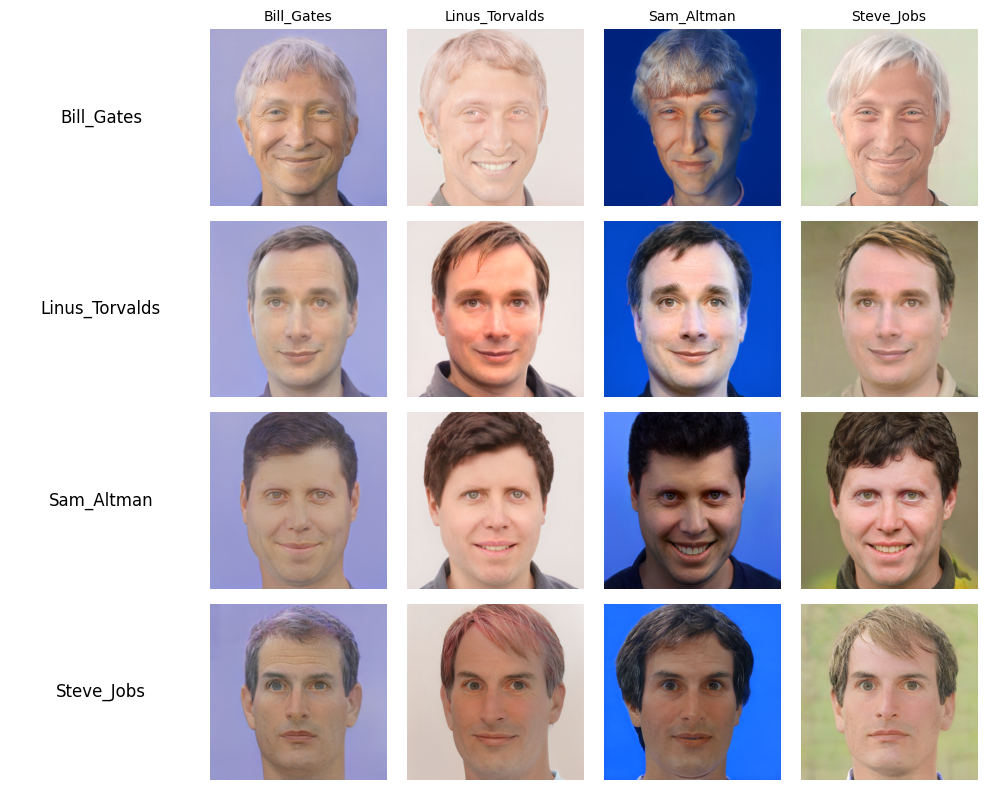

In [89]:
plot_image_mesh('hw_3_face_swap', ['Bill_Gates', 'Linus_Torvalds', 'Sam_Altman', 'Steve_Jobs'])

В качестве целевой фотографии при смене лиц использовалась 3-я фотография для каждого персонажа из директории hw_3_my_celebs_aligned. Можно увидеть, что сохранен фон для целевой фотографии (они отличаются по цвету), а также положение лица, при этом само лицо взято с оригинальной фотографии

# .

In [ ]:
ninja
cmake
dlib
imageio-ffmpeg
lpips
pytorch_msssim
torch
pickle
scikit-learn
pandas
opencv-python
Pillow
matplotlib
